In [1]:
import h5py
import numpy as np
import pandas as pd
from icecream import ic
import pickle5 as pickle
import matplotlib.pyplot as plt
import matplotlib.widgets
import plotly.graph_objects as go
import plotly.subplots
import plotly.express as px

In [2]:
%matplotlib widget

In [36]:
def fullprint(*args, **kwargs):
  from pprint import pprint
  opt = np.get_printoptions()
  np.set_printoptions(threshold=np.inf)
  pprint(*args, **kwargs)
  np.set_printoptions(**opt)

In [3]:
stimulus_path = '../resources/ff_noise.h5'
response_path = '../resources/ff_spike_response.pickle'
#response_npz_path = 'D:/Complete_analysis/For_Kevin/FF_Noise_data'
electrode_freq = 17852.767845719834 # Hz
stimulus_freq = 20 # Hz
stimulus_duration_mins = 20 # Noise file has 20min worth at 20 Hz
experiment_duration_mins = 15 # Recording only goes for 15min (different in some exps?).
experiment_duration_secs = experiment_duration_mins * 60 
stimulus_duration_secs = stimulus_duration_mins * 60
num_colors = 4

In [4]:
colormap = pd.DataFrame({
    'names':['Red', 'Green', 'UV', 'Blue', 'Sum'],
    'display_hex':['#ff0a0a', '#0aff0a', '#0a0aff', '#303030', '#0a0a0a']})
colormap

,names,display_hex
0,Red,#ff0a0a
1,Green,#0aff0a
2,UV,#0a0aff
3,Blue,#303030
4,Sum,#0a0a0a


In [5]:
interesting_cells = [20,]

In [6]:
with h5py.File(stimulus_path, 'r') as f:
    # the data has shape: [4, 24000, 10374]. This corresponds to 4 lights,
    # on-off pattern for 20min at 20 Hz (24000 periods), and 10374 boxes 
    # arranged over 2D screen space. In this experiment, only a single box
    # was used, hence the [:,0] access pattern.
    colour_noise = np.array(
        [ f['/Red_Noise'][:,0],
        f['/Green_Noise'][:,0],
        f['/Blue_Noise'][:,0],
        f['/UV_Noise'][:,0]])
print(f'shape: {colour_noise.shape}')
assert colour_noise.shape[1] == stimulus_duration_secs * stimulus_freq
colour_noise

shape: (4, 24000)


array([[0, 1, 1, ..., 0, 1, 0],
       [1, 1, 1, ..., 1, 0, 1],
       [0, 0, 0, ..., 1, 1, 0],
       [0, 0, 1, ..., 1, 1, 0]], dtype=int8)

In [7]:
with open(response_path, 'rb') as f:
    response_data = pickle.load(f)
print(f'Response data shape: {response_data.shape}',
      f'Response data index: {response_data.index.names}', sep='\n')
response_data.index

Response data shape: (4417, 2)
Response data index: ['Cell index', 'Stimulus ID', 'Recording']


MultiIndex([( 25, 1, 'Chicken_04_08_21_Phase_01'),
            ( 40, 1, 'Chicken_04_08_21_Phase_01'),
            ( 41, 1, 'Chicken_04_08_21_Phase_01'),
            ( 50, 1, 'Chicken_04_08_21_Phase_01'),
            ( 52, 1, 'Chicken_04_08_21_Phase_01'),
            ( 56, 1, 'Chicken_04_08_21_Phase_01'),
            ( 57, 1, 'Chicken_04_08_21_Phase_01'),
            ( 61, 1, 'Chicken_04_08_21_Phase_01'),
            ( 65, 1, 'Chicken_04_08_21_Phase_01'),
            ( 72, 1, 'Chicken_04_08_21_Phase_01'),
            ...
            (114, 1, 'Chicken_21_08_21_Phase_00'),
            (119, 1, 'Chicken_21_08_21_Phase_00'),
            (149, 1, 'Chicken_21_08_21_Phase_00'),
            (217, 1, 'Chicken_21_08_21_Phase_00'),
            (224, 1, 'Chicken_21_08_21_Phase_00'),
            (287, 1, 'Chicken_21_08_21_Phase_00'),
            (317, 1, 'Chicken_21_08_21_Phase_00'),
            (421, 1, 'Chicken_21_08_21_Phase_00'),
            (553, 1, 'Chicken_21_08_21_Phase_00'),
            (59

In [92]:
gdf = response_data.xs(1, level='Stimulus ID', drop_level=True).groupby('Recording')
r1 = next(iter(gdf))
r1[0]

'Chicken_04_08_21_Phase_01'

## Notes on the dataframe index

- I think that the 'Stimulus ID' sub-index is mostly 1. Chicken_06_08_21_Phase_00 uses stimulus 7, taking up 4417 rows in the table.
- Marvin mentioned that the recording done on 2021/08/17 labeled **'Chicken_17_08_21_Phase_00'** was a high-quality recording session.
- Some recording sessions were long enough to do multiple experiments. In these cases, there are multiple 'phases', such as 'Chicken_04_08_21_Phase_00' and 'Chicken_04_08_21_Phase_01'.

In [48]:
recording1 = response_data.xs(('Chicken_17_08_21_Phase_00', 1), level=('Recording', 'Stimulus ID'))
#response_data.iloc[4].Spikes.compressed()[0:4]
recording1

,Kernel,Spikes
Cell index,,
13,"[[8833.0, 9080.0, 8950.0, 8863.0], [8890.0, 90...","[908, 1882, 2684, 3622, 4515, 5353, 6281, 7183..."
14,"[[8815.0, 9012.0, 8846.0, 8825.0], [8822.0, 89...","[31, 943, 1918, 2721, 3657, 4550, 5387, 6319, ..."
17,"[[8619.0, 8770.0, 8644.0, 8615.0], [8619.0, 87...","[275, 1161, 2046, 2983, 3884, 4775, 5616, 6536..."
20,"[[2575.0, 2664.0, 2680.0, 2549.0], [2587.0, 26...","[18129, 19973, 20016, 25064, 33103, 33144, 436..."
21,"[[3767.0, 3939.0, 3982.0, 3982.0], [3772.0, 39...","[3355, 4606, 4646, 8841, 10136, 18457, 22108, ..."
...,...,...
2513,"[[18.0, 16.0, 20.0, 18.0], [18.0, 16.0, 20.0, ...","[224303, 1698791, 1984819, 3065213, 5853170, 6..."
2519,"[[5.0, 5.0, 5.0, 8.0], [5.0, 5.0, 5.0, 8.0], [...","[4961510, 7033786, 9777580, 9908458, 11025133,..."
3687,"[[1.0, 2.0, 1.0, 1.0], [1.0, 2.0, 1.0, 1.0], [...","[4022738, 9477853, 14359707, --, --, --, --, -..."


In [10]:
def get_recording_list():
    rec_list = response_data.index.get_level_values('Recording').unique().tolist()
    return rec_list
 
rec_list = ['Chicken_04_08_21_Phase_01',
            'Chicken_04_08_21_Phase_02',
            'Chicken_05_08_21_Phase_00',
            'Chicken_05_08_21_Phase_01',
            'Chicken_06_08_21_2nd_Phase_00',
            'Chicken_06_08_21_Phase_00',
            'Chicken_11_08_21_Phase_00',
            'Chicken_12_08_21_Phase_00',
            'Chicken_12_08_21_Phase_02',
            'Chicken_13_08_21_Phase_00',
            'Chicken_13_08_21_Phase_01',
            'Chicken_14_08_21_Phase_00',
            'Chicken_17_08_21_Phase_00',
            'Chicken_19_08_21_Phase_00',
            'Chicken_19_08_21_Phase_01',
            'Chicken_20_08_21_Phase_00',
            'Chicken_21_08_21_Phase_00']  

rec_name_to_id_map = {i:n for i,n in enumerate(rec_list)}

def rec_name_to_id(rec_name):
    return rec_name_to_id_map(rec_name)
    

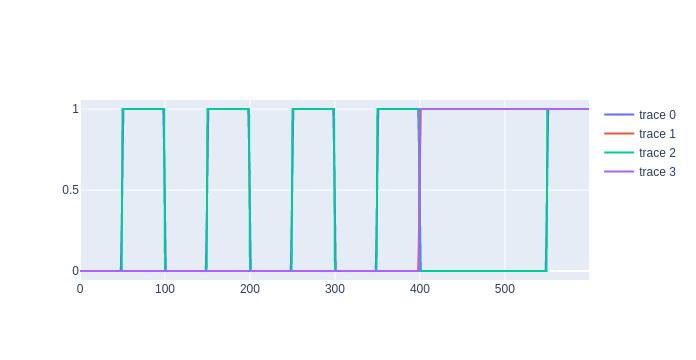

In [11]:
import scipy.ndimage
import scipy.signal

def butter_lowpass(order):
        filter_half_freq = 0.5
        b,a = scipy.signal.butter(order, filter_half_freq, btype='low')
        return b,a

def butter_lowpass_filter(data,  axis, order=2):
        b,a = butter_lowpass(order=order)
        y = scipy.signal.filtfilt(b, a, data, axis)
        return y

def upsample_stimulus(stimulus: np.ndarray, new_freq: int) -> np.ndarray:
    # Add all odd multiple sine waves up to the Nyquist frequency
    old_freq = 20
    zoom_factor = int(new_freq / old_freq)
    n_samples = zoom_factor * stimulus.shape[1]
    #up_stim = scipy.ndimage.zoom(stimulus, (1, zoom_factor), prefilter=False, order=0)
    up_stim = np.kron(stimulus, np.ones((1, zoom_factor)))
    # Mini-tutorial
    # https://danielmuellerkomorowska.com/2020/06/08/filtering-data-with-scipy/
    # The type of method that is being used.
    # https://stackoverflow.com/questions/25191620/creating-lowpass-filter-in-scipy-understanding-methods-and-units
    # We can use filtfilt instead of lfilter, as we are offline (non-streaming).
    # https://dsp.stackexchange.com/questions/19084/applying-filter-in-scipy-signal-use-lfilter-or-filtfilt
    # Use order 1 if we don't want any overshoot or undershoot.
    order = 1
    filter_half_freq = 0.5
    f_stim = butter_lowpass_filter(up_stim, axis=1, order=order)
    return f_stim

test_stim = np.array([[0,1,0,1,0,1,0,1,0,0,0,1],
                      [0,0,0,0,0,0,0,0,1,1,1,1]], dtype=np.float32)
new_freq = 1000
scale_up = int(new_freq/20)
up_stim = upsample_stimulus(test_stim, new_freq)
fig = go.Figure()
fig.add_trace(go.Scatter(y=up_stim[0]))
fig.add_trace(go.Scatter(y=up_stim[1]))
fig.add_trace(go.Scatter(y=np.kron(test_stim[0], np.ones((scale_up,)))))
fig.add_trace(go.Scatter(y=np.kron(test_stim[1], np.ones((scale_up,)))))
fig.show()

In [12]:
def time_plot(stimulus_data, spike_times):
    """
    Args:
        stimulus_data (np.ndarray): ndarray of shape (4,24000) with values 
            in {0,1} representing stimulus.
        spike_data: (np.array): np.ndarray of spike times (in electrode sample periods)
    """
    num_seconds = stimulus_duration_secs
    xs = np.arange(0, num_seconds, 1/stimulus_freq)
    #xs2 = np.arange(0, num_seconds, 1/electrode_freq)
    num_rows = 5
    spike_times = spike_times / electrode_freq
    color_sum = np.sum(stimulus_data, axis=0)

    fig = plotly.subplots.make_subplots(rows=num_rows, shared_xaxes=True, vertical_spacing=0.02)
    # go.Figure()
    def add_stim_trace(stim_data, row, color, convolve_win=4):
        smoothing_kernel = np.concatenate([np.ones(convolve_win), np.zeros(convolve_win)])/convolve_win
        #color = colormap.loc[i]['display_hex']
        scolor = '#707070'
        trace1 = go.Scatter(x=xs, y=stim_data, line_color=color, line_shape='hv')
        trace2 = go.Scatter(x=xs,  y=np.convolve(stim_data, smoothing_kernel), 
                            line_color=scolor, line_shape='spline')
        fig.add_trace(trace1, row=row, col=1)
        fig.add_trace(trace2, row=row, col=1)
        
    add_stim_trace(color_sum, row=1, color=colormap.loc[4]['display_hex'])
    for i in range(num_colors): 
        add_stim_trace(stimulus_data[i], row=i+2, color=colormap.loc[i]['display_hex'])
    spike_trace = go.Scatter(x=spike_times, y=np.ones(xs.shape), mode='markers',  name='markers', marker=dict(color='#0a0a0a'))
    fig.add_trace(spike_trace, row=1, col=1)
    fig.update_layout(autosize=False, 
                      height=600,
                      width=700,
                      margin=dict(l=1, r=1, b=1, t=1, pad=1),
                      yaxis_range=[-0.2, 4.5],
                      yaxis_fixedrange=True,
                      xaxis_range=[-10, num_seconds+10])
    return fig

In [17]:
def stim_sum_plot(stimulus, win_sec=10):
    convolve_win = win_sec * stimulus_freq
    xs = np.arange(0, stimulus_duration_secs, 1/stimulus_freq)
    colour_sum = np.sum(stimulus, axis=0)
    smoothing_kernel = np.concatenate([np.ones(convolve_win), np.zeros(convolve_win)])/convolve_win
    ys = np.convolve(colour_sum, smoothing_kernel)
    fig = go.Figure()
    trace_sum = go.Scatter(x=xs,  y=np.convolve(colour_sum, smoothing_kernel))
    fig.add_trace(trace_sum)
    for i in range(num_colors):
        trace_i = go.Scatter(x=xs,  y=np.convolve(stimulus[i], smoothing_kernel))
        fig.add_trace(trace_i)
    fig.update_layout(autosize=False, 
                      height=500,
                      width=700,
                     )#margin=dict(l=1, r=1, b=10, t=1, pad=1))
    fig.show()
    
def kernel_plot(kernel):
    fig = go.Figure()
    assert kernel.shape[0] == 2000 # 2 seconds of miliseconds
    xs = np.arange(kernel.shape[0])
    # Shift the x-axis to have zero in the middle.
    xs -= xs.shape[0] // 2
    for c in range(4):
        fig.add_trace(go.Scatter(x=xs, 
                                 y=kernel[:,c], 
                                 line_color=colormap.loc[c]['display_hex'], 
                                 mode='lines'))
    fig.add_vline(x=-100, line_width=2, line_dash='dot', line_color='grey',
                  annotation_text='-100ms', annotation_position='bottom right')
    fig.update_layout(autosize=False,
                      height=300,
                      margin=dict(l=1, r=1, b=1, t=25, pad=1),
                      yaxis_fixedrange=True,
                      showlegend=False,
                      title='Kernel',
                      title_x=0.5,
                      title_pad=dict(l=1, r=1, b=10, t=1),
                      xaxis={'title':'time (ms), with spike at 0'},
                      yaxis={'title':'summed responses'} )
    return fig

def spike_rate_plot(spikes, win_sec=10):
    num_bins = int(experiment_duration_secs / win_sec)
    spike_times = spikes / electrode_freq
    fig = px.histogram(spike_times, nbins=num_bins)
    fig.update_layout(autosize=False,
                      height=300,
                      margin=dict(l=1, r=1, b=1, t=25, pad=1),
                      showlegend=False,
                      title=f'Spike counts ({win_sec} sec bins)', 
                      title_pad=dict(l=1, r=1, b=10, t=1),
                      title_x=0.5,
                      yaxis_fixedrange=True)
    return fig

(154, 2)
(id: 35. Spike count: 2391 (2.66, per second)


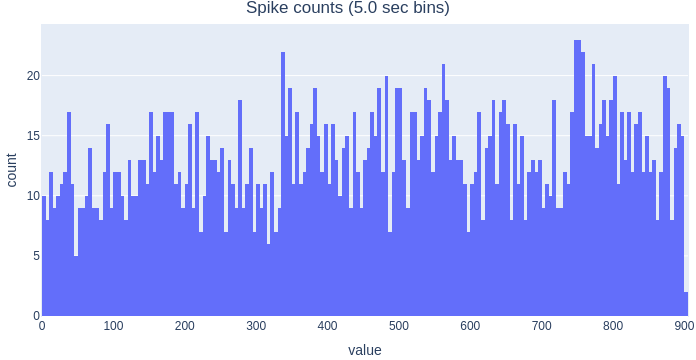

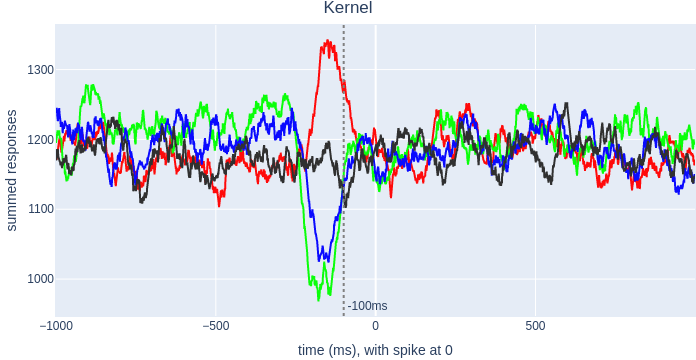

(id: 36. Spike count: 2361 (2.62, per second)


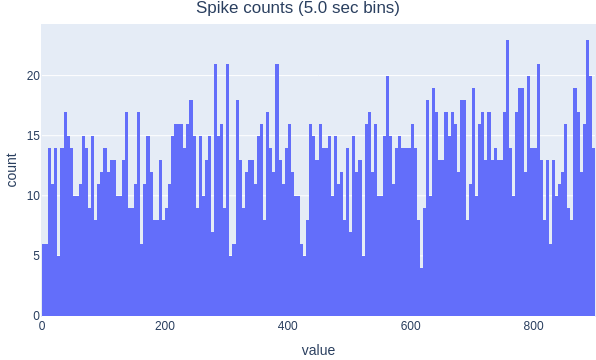

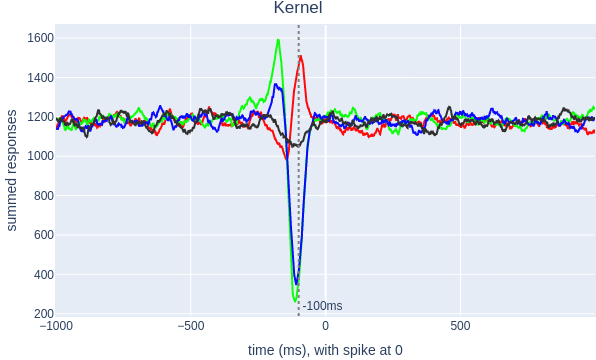

(id: 37. Spike count: 3118 (3.46, per second)


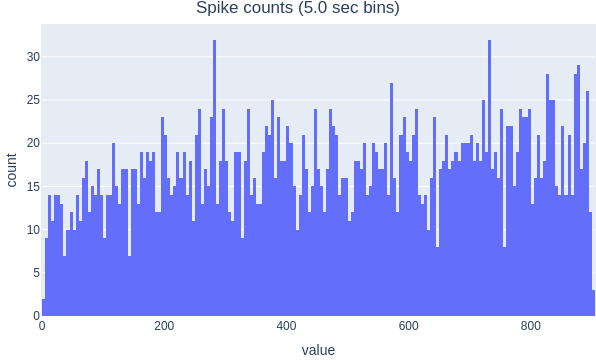

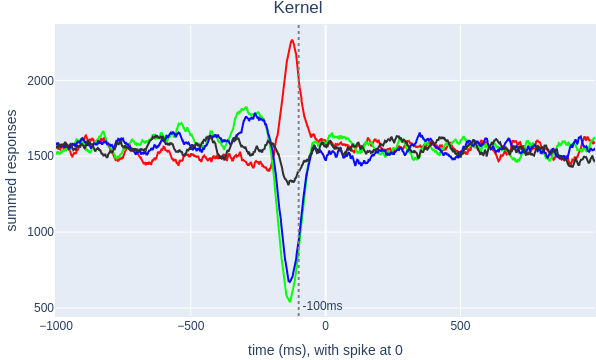

(id: 40. Spike count: 4833 (5.37, per second)


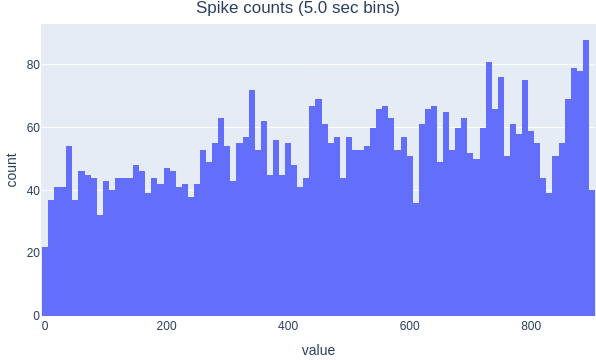

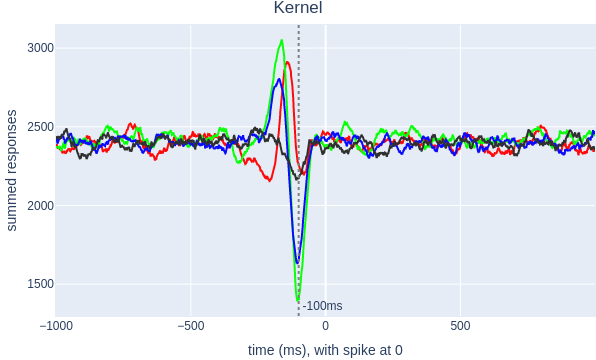

(id: 41. Spike count: 1723 (1.91, per second)


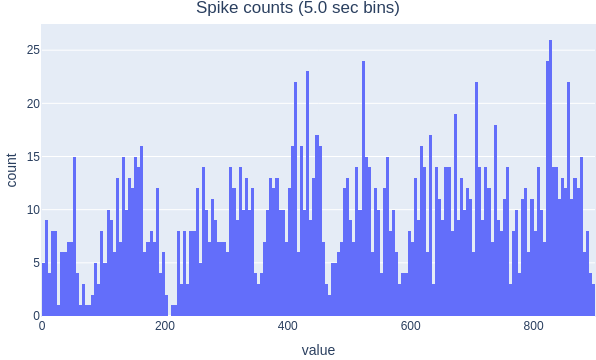

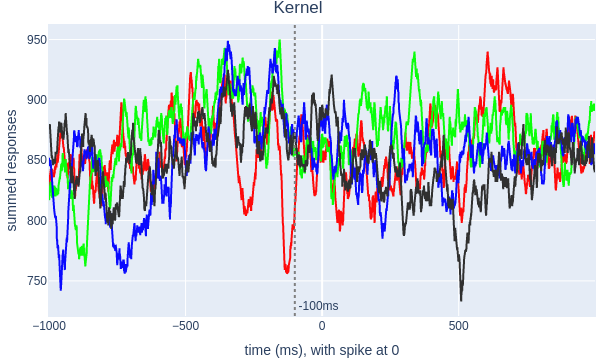

(id: 42. Spike count: 1345 (1.49, per second)


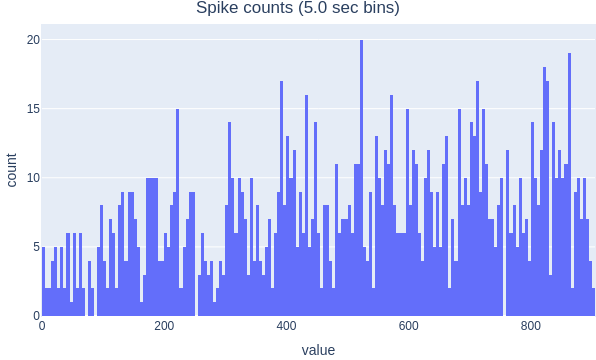

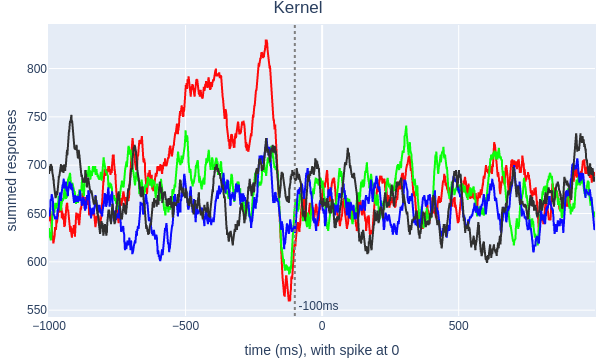

(id: 44. Spike count: 2551 (2.83, per second)


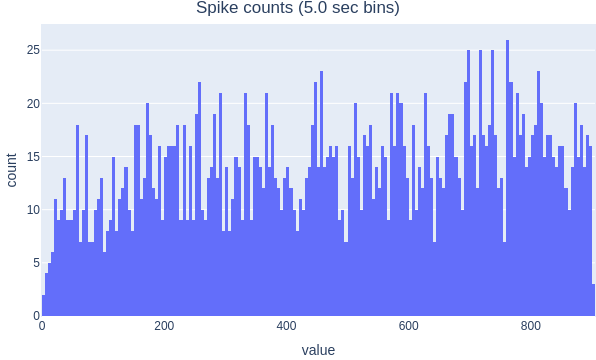

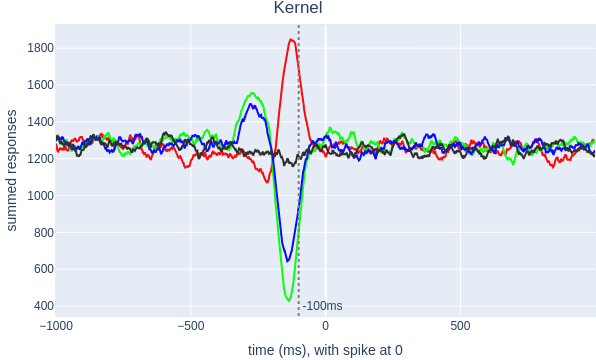

(id: 46. Spike count: 3142 (3.49, per second)


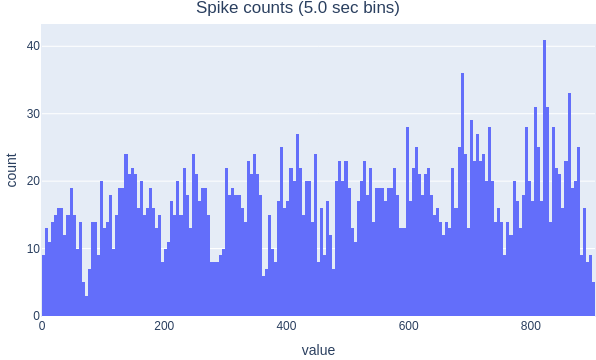

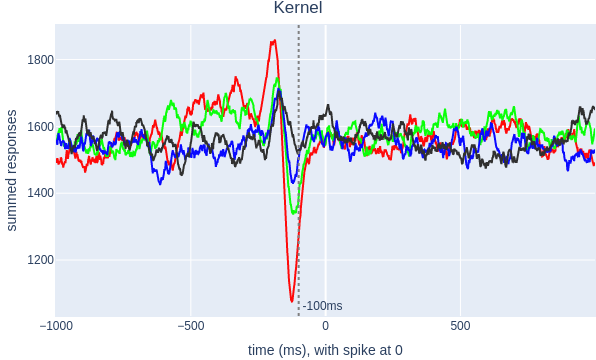

(id: 49. Spike count: 3793 (4.21, per second)


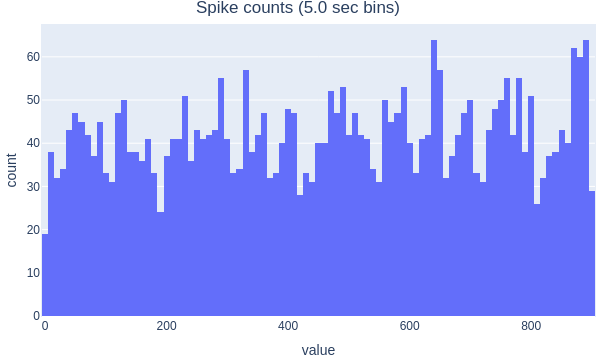

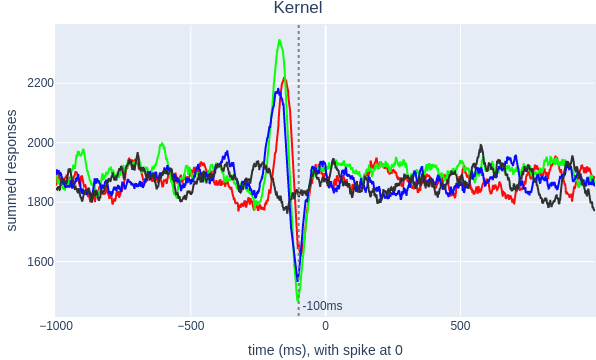

(id: 51. Spike count: 2188 (2.43, per second)


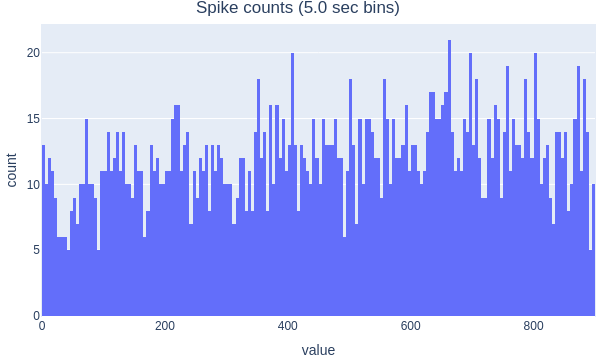

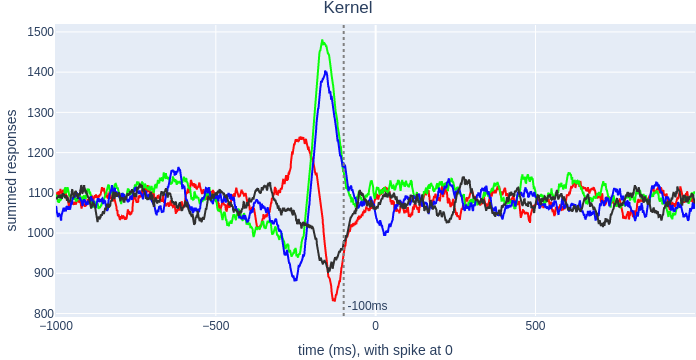

In [18]:
def plot_all(iloc):
    #data = recording1.loc[40]#9#13
    data = recording1.iloc[iloc]#9#13#15#18#21#25#27
    spikes = data['Spikes']
    print(f'(id: {data.name}. Spike count: {spikes.count()} ({spikes.count()/experiment_duration_secs:.2f}, per second)')
    spike_rate_plot(spikes, win_sec=5.0).show()
    kernel = data['Kernel']
    kernel_plot(kernel).show()
    #plot1 = time_plot(colour_noise, spikes); plot1.show()
    #px.line(x=np.arange(2000), y=selected_data1.loc[14]['Kernel'][:,0])
    #stim_sum_plot(colour_noise)
print(recording1.shape)
for i in range(10, 20):
    plot_all(i)

In [78]:
stimulus = np.array([
        [1,1,1,1], # 0
        [1,1,1,0], # 1
        [1,1,0,0], # 2
        [1,0,0,0], # 3
        [0,0,0,0], # 4
        [0,0,0,1], # 5
        [1,0,0,1], # 6
        [0,1,1,0], # 7
        [1,1,1,0], # 8
        [0,1,1,1], # 9
        ])
index = pd.MultiIndex.from_tuples(
        ((25, 1, 'Chicken_04_08_21_Phase_01'),
        (40, 1, 'Chicken_04_08_21_Phase_01'),
        (17, 1, 'Chicken_04_08_21_Phase_02'),
        (40, 1, 'Chicken_04_08_21_Phase_02')), 
        names=['Cell Index', 'Stimulus ID', 'Recording'])

data = [(None, [820, 3648]), (None, [3044, 4067]), (None, [5239,]), 
        (None, [4430,])]
response = pd.DataFrame(data, index=index, columns=['Kernel', 'Spikes'])
response

,,,Kernel,Spikes
Cell Index,Stimulus ID,Recording,,
25,1,Chicken_04_08_21_Phase_01,None,"[820, 3648]"
40,1,Chicken_04_08_21_Phase_01,None,"[3044, 4067]"
17,1,Chicken_04_08_21_Phase_02,None,[5239]
40,1,Chicken_04_08_21_Phase_02,None,[4430]


In [79]:
def scratch():
    sampling_rate = 40 # hz
    print(f'Cycles per sample: {electrode_freq / sampling_rate}')
    for i in range(4):
        sp = np.array(response.iloc[i].Spikes)
        frame = sp * (sampling_rate / electrode_freq)
        print(frame)
scratch()

Cycles per sample: 446.31919614299585
[1.83725013 8.17352252]
[6.82023096 9.11231252]
[11.73823588]
[9.92563179]
